# Preliminary analysis of MD Trajectories

In [1]:
import sys
import pytraj as pyt
import nglview
import ipywidgets
import seaborn as sns
import pandas as pd
import gc

Load the **list of residues belonging to:**
1. The **secondary structure** (Pisani et al., 2016)
2. The protein's **active site** (pocket)

In [2]:
sys.path.append('..')
from helper_modules.protein_subsequences import get_pisani_residues, get_pocket_residues
# Create the atom selection masks
mask_secnd_strc = '(:' + get_pisani_residues(sep = ',') + ')&(@CA)'
mask_pkt_Ca = '(:' + get_pocket_residues(sep = ',') + ')&(@CA)'
mask_pkt_noHs = '(:' + get_pocket_residues(sep = ',') + ')&!(@H=)'

### Load the trajectories using `pytraj`

1. Load each trajectory.
2. Perform RMSD using the atom selection mask defined above.
    - Use the initial structure as the reference
3. Compute the radius of gyration using the $C \alpha$ of the secondary structure.

In [3]:
WD = '../data/PROD_trajs/'

In [4]:
# Systems
SYSTEMS = ['WAT', 'LIG', 'MAM']
PDB_IDS = ['1fin', '4fku', '3pxf', '5a14']

rmsd_sec_dict = {}
rmsd_pkt_Ca_dict = {}
rmsd_pkt_NoHs_dict = {}
rgyr_dict = {}

for system in SYSTEMS:
    rmsd_sec_dict[system]      = {}
    rmsd_pkt_Ca_dict[system]   = {}
    rmsd_pkt_NoHs_dict[system] = {}
    rgyr_dict[system] = {}
    for pdb_id in PDB_IDS:
        # Reference structure
        ref_path = f'../data/md_system_prep/LIG_systems/{pdb_id}/{pdb_id}_A_mod.pdb'
        REF_PDB  = pyt.load(ref_path, top = ref_path) 
        # 
        pdb_path = f'{WD}/{system}_systems/{pdb_id}/md/md_imaged_noWAT.pdb'
        traj_path = f'{WD}/{system}_systems/{pdb_id}/md/md_imaged_noWAT.trr'
        traj = pyt.iterload(traj_path, top = pdb_path)
        # RMSD Secondary structure
        rmsd_sec = pyt.rmsd(traj, mask = mask_secnd_strc, ref = REF_PDB)
        # RMSD Pocket residues
        rmsd_pkt_Ca   = pyt.rmsd(traj, mask = mask_pkt_Ca, ref = REF_PDB)
        rmsd_pkt_noHs = pyt.rmsd(traj, mask = mask_pkt_noHs, ref = REF_PDB)
        # Radius of gyration
        rgyr = pyt.radgyr(traj, mask = mask_secnd_strc)
        
        # Save the values into the dictionaries
        rmsd_sec_dict[system][pdb_id] = rmsd_sec
        rmsd_pkt_Ca_dict[system][pdb_id] = rmsd_pkt_Ca
        rmsd_pkt_NoHs_dict[system][pdb_id] = rmsd_pkt_noHs
        rgyr_dict[system][pdb_id] = rgyr
        del traj
        gc.collect()

## Visualization

1. Gather the results into a `DataFrame`

In [5]:
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
sns.set(style = 'ticks', context = 'talk')

In [6]:
# Create a dataframe
def get_traj_values(ana_dict: dict, 
                    colname: str):
    df = pd.concat([pd.DataFrame(val) for val in ana_dict.values()], 
                          keys = ana_dict.keys())
    df = df.reset_index()
    df.columns = ['System', 'time (ns)'] + PDB_IDS
    df['time (ns)'] = df['time (ns)'] / 20

    df_long = df.melt(id_vars = ['System', 'time (ns)'], 
                         var_name = 'PDB_id', value_name = colname)
    df_long.head()
    return df_long

In [7]:
# Secondary structure RMSD Ca
df_traj = get_traj_values(rmsd_sec_dict, colname = 'RMSD_sec_Ca')
# Pocket RMSD Ca
new_col = 'RMSD_pkt_Ca'
df_traj[new_col] = get_traj_values(rmsd_pkt_Ca_dict, colname = new_col)[new_col]
# Radius of gyration
new_col = 'Rgyr_sec_Ca'
df_traj[new_col] = get_traj_values(rgyr_dict, colname = new_col)[new_col]
df_traj.head()

,System,time (ns),PDB_id,RMSD_sec_Ca,RMSD_pkt_Ca,Rgyr_sec_Ca
0,WAT,0.00,1fin,0.367608,0.364510,15.169946
1,WAT,0.05,1fin,0.701102,0.899786,15.181265
2,WAT,0.10,1fin,0.814633,0.692988,15.192602
3,WAT,0.15,1fin,1.042244,1.045990,15.235404
4,WAT,0.20,1fin,1.155191,1.589779,15.197721


### Visualize the four reference strucutures using `nglview`

- <mark style='background-color: red'>red</mark> = 1fin
- <mark style='background-color: lime'>green</mark> = 4fku
- <mark style='background-color: orange'>orange</mark> = 3pxf
- <mark style='background-color: deepskyblue'>blue</mark> = 5a14

In [8]:
pdb_id = '1fin'
view = nglview.show_structure_file(f'../data/md_system_prep/MAM_systems/{pdb_id}/{pdb_id}_A_mod.pdb')
view.clear_representations(0)
view[0].add_representation('cartoon', selection='protein', color = 'firebrick')
pdb_id = '3pxf'
view.add_component(f'../data/md_system_prep/MAM_systems/{pdb_id}/{pdb_id}_A_mod.pdb')
view.clear_representations(1)
view[1].add_representation('cartoon', selection='protein', color = 'orange')
pdb_id = '5a14'
view.add_component(f'../data/md_system_prep/MAM_systems/{pdb_id}/{pdb_id}_A_mod.pdb')
view.clear_representations(2)
view[2].add_representation('cartoon', selection='protein', color = 'deepskyblue')
pdb_id = '4fku'
view.add_component(f'../data/md_system_prep/MAM_systems/{pdb_id}/{pdb_id}_A_mod.pdb')
view.clear_representations(3)
view[3].add_representation('cartoon', selection='protein', color = 'lime')

view._remote_call('setSize', target='Widget', args=['','500px'])
view.camera='orthographic'
view.render_image()

print('red = 1fin,\t', 'green = 4fku,\t', 'orange = 3pxf,\t', 'blue = 5a14')
view

red = 1fin,	 green = 4fku,	 orange = 3pxf,	 blue = 5a14


NGLWidget()

In [16]:
view.render_image()

Image(value=b'', width='99%')

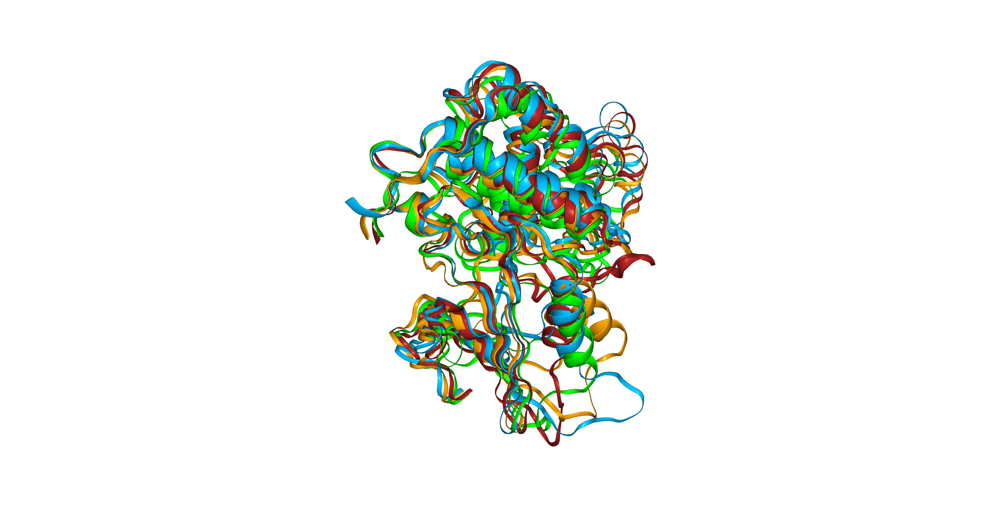

In [17]:
view._display_image()

## RMSD of the secondary structure (Å)
- RMSD in angstroms
- For each PDB_id system, its crystal structure was used as the reference.

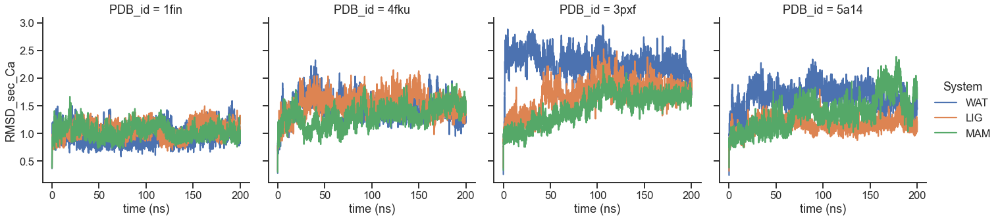

In [9]:
g = sns.relplot(x="time (ns)", y="RMSD_sec_Ca",
                hue="System", col="PDB_id", 
                kind = 'line',
                data = df_traj)
plt.show()

In [10]:
fig = px.line(df_traj, x="time (ns)", y="RMSD_sec_Ca", color="System", facet_col="PDB_id")
fig.show()

## RMSD of the active site (Å)
- RMSD in angstroms
- For each PDB_id system, its crystal structure was used as the reference.

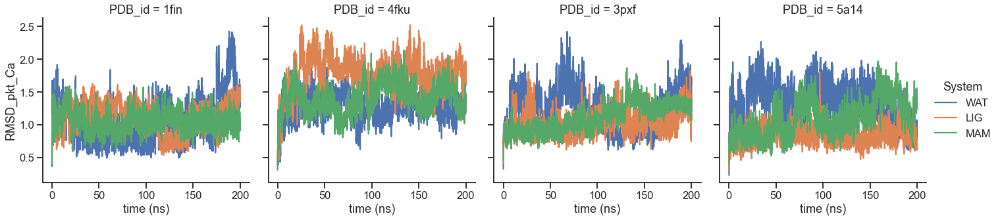

In [11]:
g = sns.relplot(x="time (ns)", y="RMSD_pkt_Ca",
                hue="System", col="PDB_id", 
                kind = 'line',
                data = df_traj)
plt.show()

In [12]:
fig = px.line(df_traj, x="time (ns)", y="RMSD_pkt_Ca", color="System", facet_col="PDB_id")
fig.show()

## Radius of Gyration (Å)
- Rgyr in angstroms

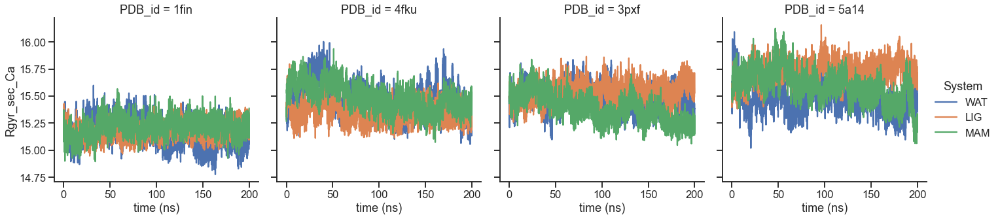

In [13]:
g = sns.relplot(x="time (ns)", y="Rgyr_sec_Ca",
                hue="System", col="PDB_id", 
                kind = 'line',
                data = df_traj)
plt.show()

In [14]:
fig = px.line(df_traj, x="time (ns)", y="Rgyr_sec_Ca", color="System", facet_col="PDB_id")
fig.show()

In [ ]:
pdb_id = '1fin'
system = 'LIG'
pdb_path = f'{WD}/{system}_systems/{pdb_id}/md/md_imaged_noWAT.pdb'
traj_path = f'{WD}/{system}_systems/{pdb_id}/md/md_imaged_noWAT.trr'
traj_sample = pyt.load(traj_path, pdb_path)
pyt.rmsd(traj_sample, mask = mask_pkt)
view = nglview.show_pytraj(traj_sample)
view.clear_representations()
view.add_representation(repr_type='cartoon', 
                        selection='solute', 
                        color='sstruc')
view.add_representation(repr_type ='licorice', 
                        selection='LIG')
view